In [50]:
# Model design
import agentpy as ap

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython

In [51]:
class ForestModel(ap.Model):

    def setup(self):

        # Create agents (trees)
        n_trees = int(self.p['Tree density'] * (self.p.size**2))
        trees = self.agents = ap.AgentList(self, n_trees)

        # Create grid (forest)
        self.forest = ap.Grid(self, [self.p.size]*2, track_empty=True)
        self.forest.add_agents(trees, random=True, empty=True)

        # Initiate a dynamic variable for all trees
        # Condition 0: Alive, 1: Burning, 2: Burned
        self.agents.condition = 0

        # Start a fire from the left side of the grid
        unfortunate_trees = self.forest.agents[0:self.p.size, 0:2]
        unfortunate_trees.condition = 1

    def step(self):

        # Select burning trees
        burning_trees = self.agents.select(self.agents.condition == 1)

        # Spread fire
        for tree in burning_trees:
            for neighbor in self.forest.neighbors(tree):
                if neighbor.condition == 0:
                    neighbor.condition = 1 # Neighbor starts burning
            tree.condition = 2 # Tree burns out

        # Stop simulation if no fire is left
        # if len(burning_trees) == 0:
        #     self.stop()

    def end(self):

        # Document a measure at the end of the simulation
        burned_trees = len(self.agents.select(self.agents.condition == 2))
        print(burned_trees)
        self.report('Percentage of burned trees',
                    burned_trees / len(self.agents))

In [61]:
# Define parameters

parameters = {
    'Tree density': 0.4, # Percentage of grid covered by trees
    'size': 100, # Height and length of the grid
    'steps': 200,
}
model = ForestModel(parameters)
results = model.run()

Completed: 200 steps1610

Run time: 0:00:00.187354
Simulation finished


In [62]:
results.reporters

,seed,Percentage of burned trees
0,109562036865222723174057352452437845887,0.4025


In [53]:
# Create single-run animation with custom colors

def animation_plot(model, ax):
    attr_grid = model.forest.attr_grid('condition')
    color_dict = {0:'#7FC97F', 1:'#d62c2c', 2:'#e5e5e5', None:'#d5e5d5'}
    ap.gridplot(attr_grid, ax=ax, color_dict=color_dict, convert=True)
    ax.set_title(f"Simulation of a forest fire\n"
                 f"Time-step: {model.t}, Trees left: "
                 f"{len(model.agents.select(model.agents.condition == 0))}")

fig, ax = plt.subplots()
model = ForestModel(parameters)
animation = ap.animate(model, fig, ax, animation_plot)
IPython.display.HTML(animation.to_jshtml(fps=15))

In [25]:
# Prepare parameter sample
parameters = {
    'Tree density': ap.Range(0.1, 0.95),
    'size': ap.IntRange(50, 100),
    'steps': 200
}
sample = ap.Sample(parameters, 
                   n=128, 
                   method='saltelli',
                   calc_second_order=False)

In [26]:
# Perform experiment
exp = ap.Experiment(ForestModel, sample, iterations=40)
results = exp.run()

Scheduled runs: 20480
15
Completed: 1, estimated time remaining: 0:12:4513
Completed: 2, estimated time remaining: 0:11:2928
Completed: 3, estimated time remaining: 1:05:3818
Completed: 4, estimated time remaining: 0:51:4818
Completed: 5, estimated time remaining: 0:43:2426
Completed: 6, estimated time remaining: 0:37:5818
Completed: 7, estimated time remaining: 0:34:0115
Completed: 8, estimated time remaining: 0:31:1512
Completed: 9, estimated time remaining: 0:28:5514
Completed: 10, estimated time remaining: 0:27:0517
Completed: 11, estimated time remaining: 0:25:3426
Completed: 12, estimated time remaining: 0:24:1910
Completed: 13, estimated time remaining: 0:23:1424
Completed: 14, estimated time remaining: 0:22:2316
Completed: 15, estimated time remaining: 0:21:3421
Completed: 16, estimated time remaining: 0:20:5419
Completed: 17, estimated time remaining: 0:20:2418
Completed: 18, estimated time remaining: 0:19:5915
Completed: 19, estimated time remaining: 0:19:3110
Completed: 20, 

In [34]:
sns.set_theme(style="whitegrid")
sns.set_context("talk")

/Users/pedrosousa/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/pedrosousa/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


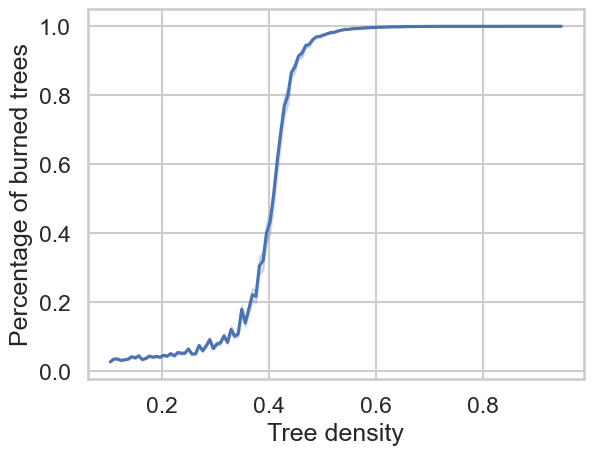

In [39]:
# Plot sensitivity
# sns.set_theme()
sns.lineplot(
    data=results.arrange_reporters(),
    x='Tree density',
    y='Percentage of burned trees'
);

/Users/pedrosousa/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/pedrosousa/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


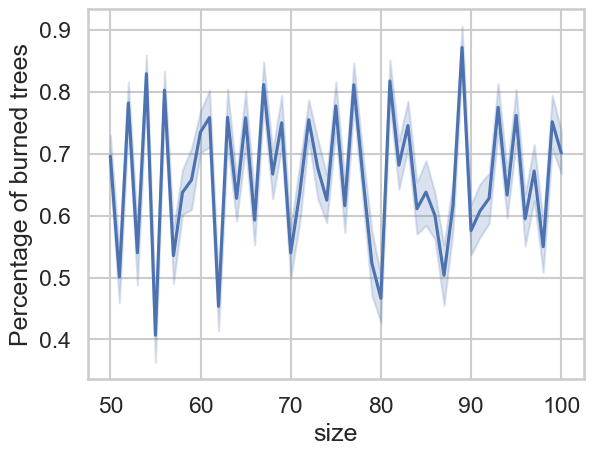

In [41]:
sns.lineplot(
    data=results.arrange_reporters(),
    x='size',
    y='Percentage of burned trees'
);

/Users/pedrosousa/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/pedrosousa/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/pedrosousa/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/pedrosousa/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a fu

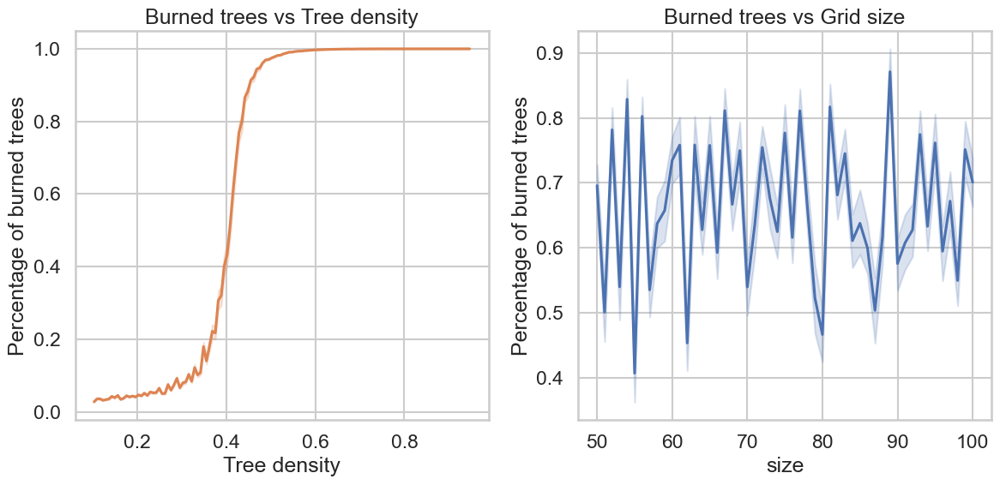

In [49]:
# Arrange reporters only once for efficiency
data = results.arrange_reporters()

# Create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

palette = sns.color_palette()

# Create lineplot on the first subplot
sns.lineplot(
    ax=axs[1],  # This selects the first subplot
    data=data,
    x='size',
    y='Percentage of burned trees',
    color=palette[0],  # Set color to blue
    # label='Size vs Burned trees'  # Add label for legend
)
axs[1].set_title('Burned trees vs Grid size')  # Add title to the first subplot

# Create regplot on the second subplot
sns.lineplot(
    ax=axs[0],  # This selects the second subplot
    data=data,
    x='Tree density',
    y='Percentage of burned trees',
    color=palette[1],  # Set color to red
    # label='Tree density vs Burned trees'  # Add label for legend
)
axs[0].set_title('Burned trees vs Tree density')  # Add title to the second subplot

# Show the plots
plt.tight_layout()
plt.show()

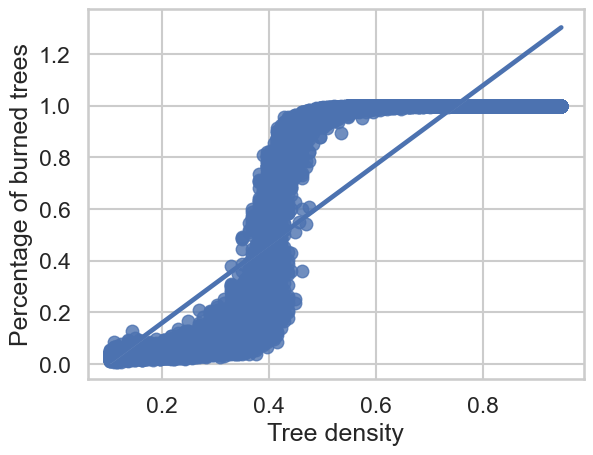

In [38]:
sns.regplot(
    data=results.arrange_reporters(),
    x='Tree density',
    y='Percentage of burned trees'
);

In [28]:
results.calc_sobol()

DataDict {
'info': Dictionary with 12 keys
'parameters': 
    'constants': Dictionary with 1 key
    'sample': DataFrame with 2 variables and 512 rows
    'log': Dictionary with 5 keys
'reporters': DataFrame with 2 variables and 20480 rows
'sensitivity': 
    'sobol': DataFrame with 2 variables and 2 rows
    'sobol_conf': DataFrame with 2 variables and 2 rows
}

In [29]:
results.reporters

seed  \
sample_id iteration                                            
0         0          312508920398284619354278934175142638754   
          1          327119439923054869075060430978495753290   
          2          128765864949267933288005671604981378440   
          3          266462387714655976067711890188641717709   
          4          195568733931135169868779538501640261724   
...                                                      ...   
511       35          61347624649673789200264296887261664395   
          36         205891089927398989751602053814695394272   
          37         188057112475057686460462545198813429212   
          38         155088098760591669029809257317014208592   
          39         243008040061558493146764805021296995978   

                     Percentage of burned trees  
sample_id iteration                              
0         0                            0.031381  
          1                            0.027197  
          2                            0.058577  
          3                            0.037657  
          4                            0.037657  
...                                         ...  
511       35                           0.999575  
          36                           0.999788  
          37                           1.000000  
          38                           1.000000  
          39                           1.000000  

[20480 rows x 2 columns]

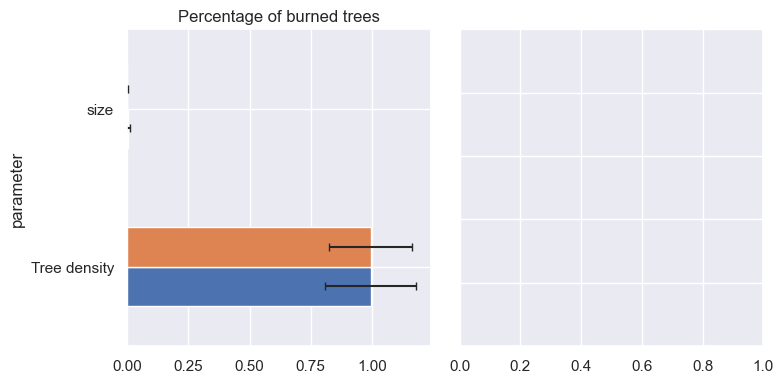

In [32]:
def plot_sobol(results):
    """ Bar plot of Sobol sensitivity indices. """

    sns.set()
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    si_list = results.sensitivity.sobol.groupby(by='reporter')
    si_conf_list = results.sensitivity.sobol_conf.groupby(by='reporter')

    for (key, si), (_, err), ax in zip(si_list, si_conf_list, axs):
        si = si.droplevel('reporter')
        err = err.droplevel('reporter')
        si.plot.barh(xerr=err, title=key, ax=ax, capsize = 3)
        ax.set_xlim(0)

    axs[0].get_legend().remove()
    axs[1].set(ylabel=None, yticklabels=[])
    axs[1].tick_params(left=False)
    plt.tight_layout()

plot_sobol(results)

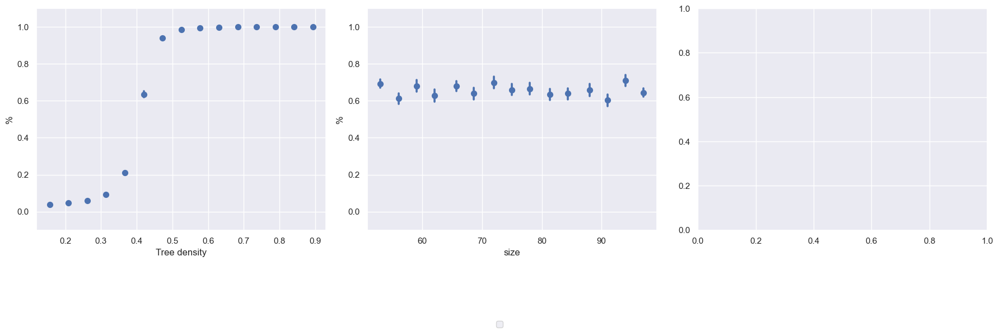

In [33]:
def plot_sensitivity(results):
    """ Show average simulation results for different parameter values. """

    # sns.set()
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    data = results.arrange_reporters().astype('float')
    params = results.parameters.sample.keys()

    for x, ax in zip(params, axs):
        for y in results.reporters.columns:
            if y not in ['seed', 'Total share infected']:
                sns.regplot(x=x, y=y, data=data, ax=ax, ci=99,
                            x_bins=15, fit_reg=False, label=y)
        ax.set_ylim(-0.1,1.1)
        ax.set_ylabel('%')

    ## Get the handles and labels from the last axes object
    handles, labels = axs[-1].get_legend_handles_labels()

    # Create a single legend for the figure
    fig.legend(handles, labels, loc='lower center', ncol=3)

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.3)  # Make space for the legend

plot_sensitivity(results)